# Libraries & Data

In [1]:
import numpy as np 
import pandas as pd
import os
import matplotlib.pyplot as plt
import os
import random
import cv2
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPool2D, Conv2DTranspose, Concatenate, Input, Dropout
from tensorflow.keras.models import Model
from keras.models import *
from keras.layers import *
from keras.optimizers import *
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        os.path.join(dirname, filename)
base_directory = '/kaggle/input/flood-area-segmentation'
images_folder = os.path.join(base_directory, 'images') #path of image folder
masks_folder = os.path.join(base_directory, 'masks')#path of mask folder
data = pd.read_csv(os.path.join(base_directory, 'metadata.csv'))
data.head()


,Image,Mask
0,0.jpg,0.png
1,1.jpg,1.png
2,2.jpg,2.png
3,3.jpg,3.png
4,4.jpg,4.png


# Segmentation

In [2]:
size = 512
bs=32
seed=1234

image_datagen = ImageDataGenerator(rescale=1./255,validation_split=0.2) #split train and validation set
mask_datagen = ImageDataGenerator(rescale=1./255,validation_split=0.2)

train_image_generator = image_datagen.flow_from_directory(#get data from a directory 
        '/kaggle/input/flood-area-segmentation/Image',
        target_size=(size,size),
        class_mode = None, #Set this to None, to return only the images
        classes = ['images'],
        batch_size = bs,
        seed=seed,
        subset='training')#this will be the training set
    
train_mask_generator = mask_datagen.flow_from_directory(
        '/kaggle/input/flood-area-segmentation/Mask',
        target_size=(size,size),
        class_mode = None,
        classes = ['masks'],
        color_mode = 'grayscale', #  image is either black and white or grayscale set “grayscale” /if the image has three color channels, set “rgb”.
        batch_size = bs,
        seed=seed,
        subset='training')

val_image_generator = image_datagen.flow_from_directory(
        '/kaggle/input/flood-area-segmentation/Image',
        target_size=(size,size),
        class_mode = None,
        classes = ['images'],
        batch_size = bs,
        seed=seed,
        subset='validation')
    
val_mask_generator = mask_datagen.flow_from_directory(
        '/kaggle/input/flood-area-segmentation/Mask',
        target_size=(size,size),
        class_mode = None,
        classes = ['masks'],
        color_mode = 'grayscale',
        batch_size = bs,
        seed=seed,
        subset='validation')

train_generator = zip(train_image_generator, train_mask_generator)
val_generator = zip(val_image_generator, val_mask_generator)

Found 0 images belonging to 1 classes.
Found 0 images belonging to 1 classes.
Found 0 images belonging to 1 classes.
Found 0 images belonging to 1 classes.


# Create Data Paths

In [3]:
def create_data(data_dir): 
    image_paths = []
    mask_paths = []
    folds = sorted(os.listdir(data_dir)) #['metadata.csv', 'Mask', 'Image']
    for fold in folds:
        foldpath = os.path.join(data_dir, fold)
        #'/kaggle/input/flood-area-segmentation/Image' or '/kaggle/input/flood-area-segmentation/MASK'
        if fold in ['Image']:
            images = sorted(os.listdir(foldpath))
            #['0.jpg','1.jpg', '10.jpg','1000.jpg',...]
            for image in images:
                fpath = os.path.join(foldpath, image)
                #assign path to all images
                #'/kaggle/input/flood-area-segmentation/Image/0.jpg' 
                image_paths.append(fpath)

        elif fold in ['Mask']:
            masks = sorted(os.listdir(foldpath))
            for mask in masks:
                fpath = os.path.join(foldpath, mask)#assign path to all mask
                mask_paths.append(fpath)
        else:
            continue
        
    return image_paths, mask_paths

image_paths, mask_paths = create_data('/kaggle/input/flood-area-segmentation')

# Load Images and Masks

In [4]:
SIZE = 256

def load_image(image, SIZE):
    return np.round(tf.image.resize(img_to_array(load_img(image)) / 255., (SIZE, SIZE)), 4) #load and resize the image to desired size and round to 4 decimal

def load_images(image_paths, SIZE, mask=False, trim=None):
    if trim is not None:
        image_paths = image_paths[:trim]
    if mask:
        images = np.zeros(shape=(len(image_paths), SIZE, SIZE, 1)) #an empty array that has a shape of (len(mask_paths), SIZE, SIZE, 1)
        #mask  will be in greyscale
        #[[[0.],
        # [0.],
        #[0.],
    else:
        images = np.zeros(shape=(len(image_paths), SIZE, SIZE, 3))# an empty array that has a shape of (len(image_paths), SIZE, SIZE, 3)
        #image will be in rgb
        #[0., 0., 0.]
        #[0., 0., 0.],
    for i, image in enumerate(image_paths):
        img = load_image(image, SIZE) # the image will be load and resize the image to desired size and round to 4 decimal
        if mask:
            images[i] = img[:, :, :1]# then insert mask image array into the array that was created 
        else:
            images[i] = img #then insert image array into the array that was created 

    return images

# load images and masks
imgs = load_images(image_paths, SIZE)
msks = load_images(mask_paths, SIZE, mask=True)



# Image Show Functions

In [5]:
def show_image(image, title=None, cmap=None, alpha=1):#alpha was set to 1 means the image will be non-transparent 
    plt.imshow(image, cmap=cmap, alpha=alpha)
    if title is not None:
        plt.title(title)
    plt.axis('off')
    
def show_mask(image, mask, cmap=None, alpha=0.4):#alpha was set to closer to 0 means the image will become slightly transparent 
    plt.imshow(image)
    plt.imshow(tf.squeeze(mask), cmap=cmap, alpha=alpha)
    plt.axis('off')

def show_images(imgs, msks):
    plt.figure(figsize=(13,8))
    for i in range(15):
        plt.subplot(3,5,i+1)
        id = np.random.randint(len(imgs))
        show_mask(imgs[id], msks[id], cmap='binary')
    plt.tight_layout()
    plt.show()

def display(display_list):
    plt.figure(figsize=(15, 15))
    title = ["Input Image", "True Mask", "Predicted Mask"]
    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.utils.array_to_img(display_list[i]))
        plt.axis("off")
    plt.show()
    


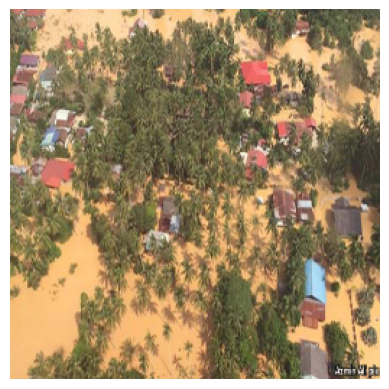

In [6]:
show_image(imgs[1]) #we can see that this is the original image

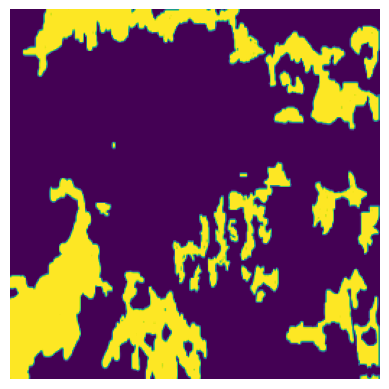

In [7]:
show_image(msks[1])#this was taken from the mask image 

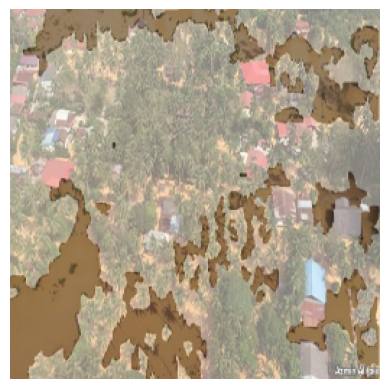

In [8]:
show_mask(imgs[1],msks[1],cmap='binary') #this image add a  layer of mask on the original, the mask layer was modify to be slightly transparent 

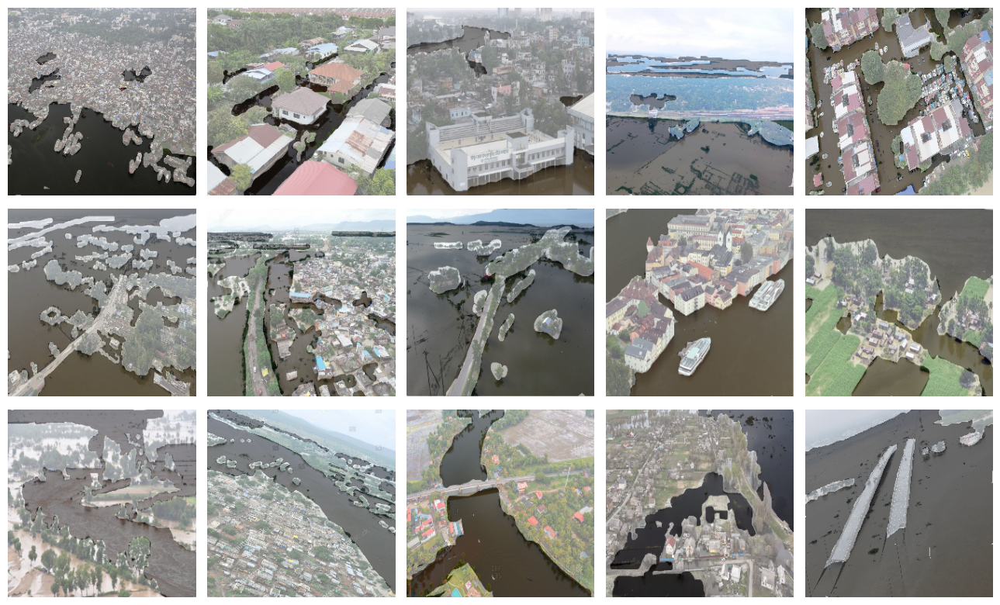

In [9]:
SIZE = 256

# get data
data_dir = '/kaggle/input/flood-area-segmentation'
image_paths, mask_paths = create_data(data_dir)

# load images and masks
imgs = load_images(image_paths, SIZE)
msks = load_images(mask_paths, SIZE, mask=True)

# show sample
show_images(imgs, msks)

# Plot History Function

In [10]:
#This function take training model and plot history of accuracy and losses with the best epoch in both of them.

def plot_training(hist):    

    # Define needed variables
    tr_acc = hist.history['accuracy']
    tr_loss = hist.history['loss']
    val_acc = hist.history['val_accuracy']
    val_loss = hist.history['val_loss']
    index_loss = np.argmin(val_loss)
    val_lowest = val_loss[index_loss]
    index_acc = np.argmax(val_acc)
    acc_highest = val_acc[index_acc]
    Epochs = [i+1 for i in range(len(tr_acc))]
    loss_label = f'best epoch= {str(index_loss + 1)}'
    acc_label = f'best epoch= {str(index_acc + 1)}'

    # Plot training history
    plt.figure(figsize= (20, 8))
    plt.style.use('fivethirtyeight')

    plt.subplot(1, 2, 1)
    plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
    plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
    plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
    plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
    plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.tight_layout
    plt.show()

# U-Net Architecture

In [19]:
image_size = (SIZE,SIZE, 3)
def unet(sz=image_size):
    x = Input(sz)
    inputs = x
    
    #downsampling
    #There will be 6 same structure for downsmapling, the number of filter for each structure will be increased in the factor of 2
    f = 8 #number of filters
    layers = []
    for i in range(6):
        x = Conv2D(f, 3, activation='relu',padding='same')(x)
        x = Conv2D(f, 3, activation='relu',padding='same')(x)
        layers.append(x)
        x = MaxPooling2D()(x)
        f = f*2
    ff2 = 64
    
   #bottleneck is a Skip Connection in UNET, it  allow information to travel between the contracting (encoding) and expanding (decoding) paths. 
   #They are critical for maintaining spatial information and improving segmentation accuracy 

    #bottleneck
    j = len(layers)-1
    x = Conv2D(f, 3, activation='relu',padding='same')(x)
    x = Conv2D(f, 3, activation='relu',padding='same')(x)
    x = Conv2DTranspose(ff2, 2, strides=(2,2),padding='same')(x) # Conv2DTranspose works the opposite direction of how MaxPooling2D works, rather than shrinking the size of input , transpose enlarge the size of input. 
    x = Concatenate(axis=3)([x,layers[j]])#Concatenate is used to implement Skip Connection in UNET, it  allow information to travel between the contracting (encoding) and expanding (decoding) paths.
    j = j-1

    
    
    #upsampling
    for i in range(5):
        ff2 = ff2//2
        f = f//2
        x = Conv2D(f, 3, activation='relu',padding='same')(x)
        x = Conv2D(f, 3, activation='relu',padding='same')(x)
        x = Conv2DTranspose(ff2, 2, strides=(2,2),padding='same')(x)
        x = Concatenate(axis=3)([x,layers[j]])
        j = j-1
    #classification 
    x = Conv2D(f, 3, activation='relu',padding='same')(x)
    x = Conv2D(f, 3, activation='relu',padding='same')(x)
    outputs = Conv2D(1, 1, activation = 'sigmoid')(x)
    model = Model(inputs=[inputs], outputs = [outputs])
    
    return model

We can look at Unet as the strucutre of encode and decode where downsmapling is encode and upsampling is decode.  

In [20]:
model = unet()
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_27 (Conv2D)             (None, 256, 256, 8)  224         ['input_2[0][0]']                
                                                                                                  
 conv2d_28 (Conv2D)             (None, 256, 256, 8)  584         ['conv2d_27[0][0]']              
                                                                                                  
 max_pooling2d_6 (MaxPooling2D)  (None, 128, 128, 8)  0          ['conv2d_28[0][0]']        

# Show Sample

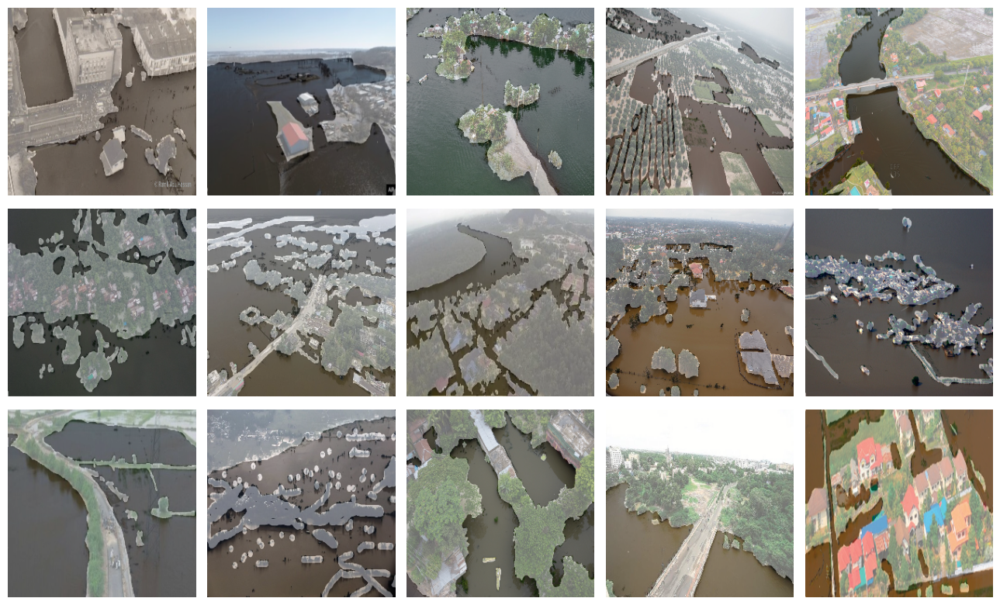

In [13]:
# show sample
show_images(imgs, msks)

# Train the Model

In [21]:
model.compile(optimizer = Adam(learning_rate = 1e-4), loss = 'binary_crossentropy', metrics = ['accuracy'])

In [22]:
batch_size = bs     
epochs = 50      
ask_epoch = 5  
steps = len(imgs)//batch_size

In [23]:
# Training
history = model.fit(
    imgs,msks,
    validation_split=0.2,
    epochs=epochs,
    verbose=1,
    steps_per_epoch=steps,
    
)

Epoch 1/50
9/9 [==============================] - 53s 6s/step - loss: 0.6925 - accuracy: 0.4151 - val_loss: 0.6940 - val_accuracy: 0.3542
Epoch 2/50
9/9 [==============================] - 50s 6s/step - loss: 0.6913 - accuracy: 0.4325 - val_loss: 0.6923 - val_accuracy: 0.3930
Epoch 3/50
9/9 [==============================] - 49s 5s/step - loss: 0.6901 - accuracy: 0.4702 - val_loss: 0.6907 - val_accuracy: 0.4535
Epoch 4/50
9/9 [==============================] - 48s 5s/step - loss: 0.6887 - accuracy: 0.5213 - val_loss: 0.6886 - val_accuracy: 0.5304
Epoch 5/50
9/9 [==============================] - 48s 5s/step - loss: 0.6869 - accuracy: 0.5957 - val_loss: 0.6856 - val_accuracy: 0.6447
Epoch 6/50
9/9 [==============================] - 48s 5s/step - loss: 0.6847 - accuracy: 0.6751 - val_loss: 0.6825 - val_accuracy: 0.7147
Epoch 7/50
9/9 [==============================] - 49s 5s/step - loss: 0.6820 - accuracy: 0.7106 - val_loss: 0.6784 - val_accuracy: 0.7569
Epoch 8/50
9/9 [==================

# Plot the History

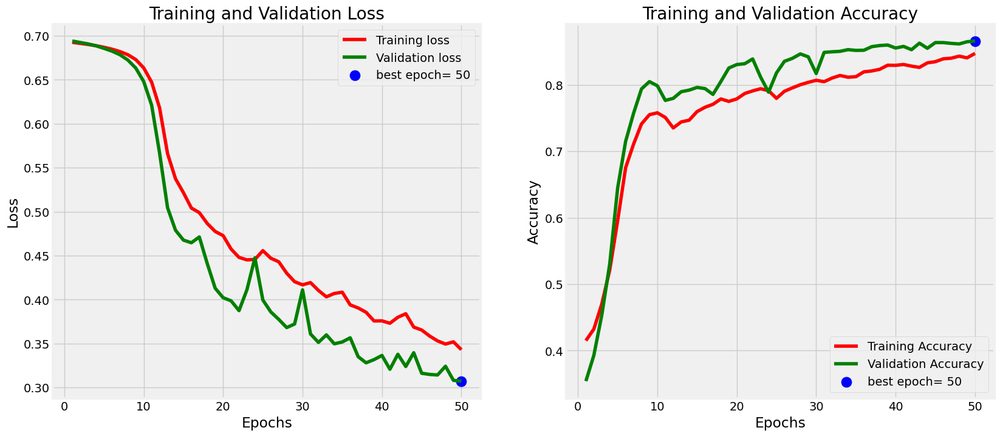

In [24]:
plot_training(history)

# Evaluation

1/1 [==============================] - 0s 80ms/step


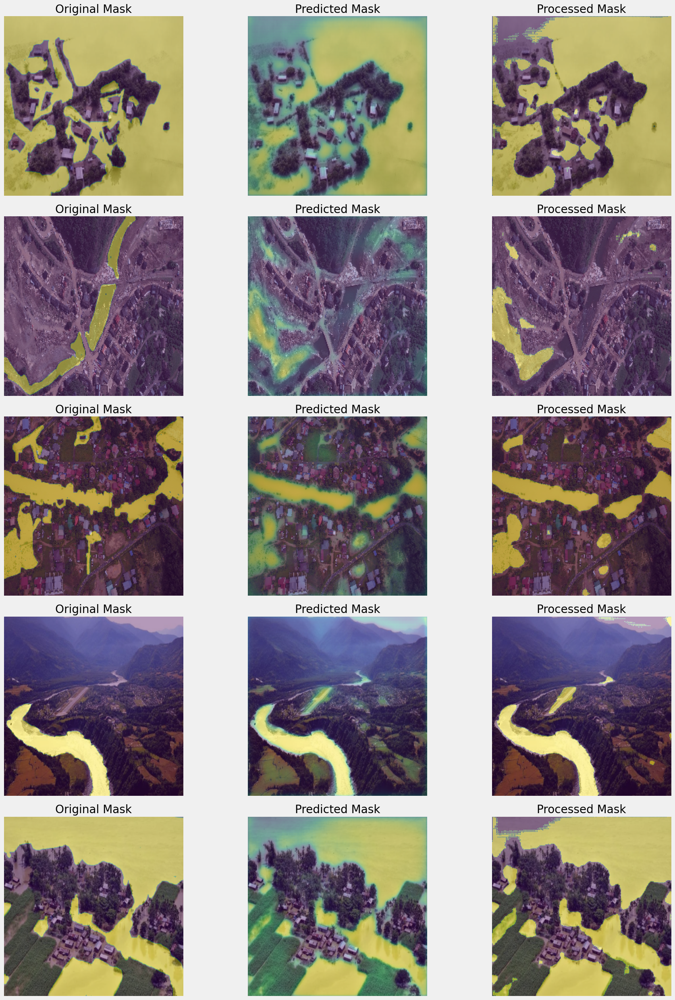

In [25]:
plt.figure(figsize=(20,25))
n=0
for i in range(1,(5*3)+1):
    plt.subplot(5,3,i)
    if n==0:
        id = np.random.randint(len(imgs))
        image = imgs[id]
        mask = msks[id]
        pred_mask = model.predict(image[np.newaxis,...])

        plt.title("Original Mask")
        show_mask(image, mask)
        n+=1
    elif n==1:
        plt.title("Predicted Mask")
        show_mask(image, pred_mask)
        n+=1
    elif n==2:
        pred_mask = (pred_mask>0.5).astype('float')
        plt.title("Processed Mask")
        show_mask(image, pred_mask)
        n=0
plt.tight_layout()
plt.show()